In [1]:
# Standard library imports
from io import BytesIO
import math
import os
from pathlib import Path
import random
import requests
from typing import List, Optional, Tuple, Union

# Third party imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import pytorch_lightning as pl
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
import timm
from timm.data.constants import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
import torch
from torchvision.io import read_image
import torchvision.models as models
import torchvision.transforms as transforms

plt.ion()

In [119]:
def get_site_names() -> List[str]:
    """
    ----------
    Returns
    ----------
    A list of Phenocam site names, according to the site table.
    """
    site_names = []
    resp = requests.get('https://phenocam.sr.unh.edu/webcam/network/table/')
    if resp.ok:
        arr0 = resp.text.split('<tbody>')
        arr1 = arr0[1].split('</tbody>')
        arr2 = arr1[0].split('<a href=')
        for i in range(1, len(arr2)):
            name = arr2[i].split('</a>')[0].split('>')[1]
            site_names.append(name)
    else:
        print('Could not retrieve site names')
    return site_names


def get_site_dates(site_name: str) -> Tuple[str, str]:
    """
    ----------
    Parameters
    ----------
    site_name: The name of the Phenocam site to download from (e.g., canadaojp).
    
    ---------
    Returns
    ---------
    A tuple where the first element is the start date and the second element is the
    end date corresponding to the given site.
    
    ---------
    Example
    ---------
    >>> get_site_dates('canadaojp')
    ('2015-12-31', '2020-12-31')
    """
    start_date, end_date = None, None
    resp = requests.get(f'https://phenocam.sr.unh.edu/webcam/sites/{site_name}/')    
    if resp.ok:
        start_date = resp.text.split('<strong>Start Date:</strong> ')[1][:10]
        end_date = resp.text.split('<strong>Last Date:</strong> ')[1][:10]
    else:
        print('Could not retrieve start and end date')
    return (start_date, end_date)


def download(site_name: str, dates: Tuple[str, str], save_to: Union[str, Path],
             n_photos: Optional[int] = 100, verbose: Optional[bool] = False) -> Tuple[List[str], List[str]]:
    """
    ----------
    Parameters
    ----------
    site_name: The name of the site to download from. A list of acceptable site names
               can be found by running get_site_names().
    dates:     A tuple indicating the range of dates you want your downloaded photos
               to come from. A tuple of the max possible range can be found by running
               get_site_dates().
    save_to:   The directory to save the downloaded images to. If the directory
               already exists, it is NOT cleared. The new photos will simply be added
               to the directory, except for duplicates.
    n_photos:  The number of photos to be downloaded. (Default is 100.)
    verbose:   Whether to print message on error. (Default is False.)
                   
    ----------
    Returns
    ----------
    A tuple where the first element is a list of URLs that were successfully downloaded
    and the second element is a list of URLs that were not successfully downloaded.
    
    ----------
    Example
    ----------
    >>> download('canadojp', ('2017-03-01', '2017-04-01'), 'my_photos', n_photos=1, verbose=False)
    Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2017/02/canadaojp_2017_02_27_135959.jpg
    Done!
    (['https://phenocam.sr.unh.edu/data/archive/canadaojp/2017/02/canadaojp_2017_02_27_135959.jpg'],
     [])
    """
    date_range = list(pd.date_range(start=dates[0], end=dates[1], freq='30min'))
    random.shuffle(date_range)
    home_url = f'https://phenocam.sr.unh.edu/webcam/browse/{site_name}'
    img_template = f'https://phenocam.sr.unh.edu/data/archive/{site_name}'
    successes, failures = [], []
    
    save_dir = Path(save_to)
    if not save_dir.is_dir():
        os.mkdir(save_dir)
    
    while (len(successes) + len(failures)) < n_photos and len(date_range) > 0:
        my_datetime = date_range.pop()
        Y = str(my_datetime.year)
        m = str(my_datetime.month).zfill(2)
        D = str(my_datetime.day).zfill(2)
        month_url = f'{home_url}/{Y}/{m}/{D}'
        resp1 = requests.get(month_url)
        if resp1.ok:
            arr = resp1.text.split('<span class="imglabel">')[1:]
            success = False
            for a in arr:
                orig_timestamp = a.split('&nbsp')[0].strip()
                strip_timestamp = orig_timestamp.replace(':', '')
                try:
                    pd_timestamp = pd.to_datetime(f'{Y}-{m}-{D} {orig_timestamp}')
                except:
                    if verbose:
                        print(f'Could not parse {orig_timestamp}')
                    break
                if abs(my_datetime - pd_timestamp) <= pd.Timedelta('5min'):
                    img_fname = f'{site_name}_{Y}_{m}_{D}_{strip_timestamp}.jpg'
                    img_url = f'{img_template}/{Y}/{m}/{img_fname}'
                    output_fpath = save_dir.joinpath(img_fname)
                    if output_fpath.is_file() and verbose:
                        print(f'{img_fname} was already downloaded, skipping')
                        break
                    resp2 = requests.get(img_url)
                    if resp2.ok:
                        try:
                            img = Image.open(BytesIO(resp2.content))
                            img.save(output_fpath)
                            success = True
                            successes.append(img_url)
                        except:
                            if verbose:
                                print(f'Could not save {output_fpath}')
                        if verbose:
                            print(f'Retrieved {resp2.url}')
                        break
                    else:
                        failures.append(img_url)
            if not success and verbose:
                print(f'Could not find an image within 5 minutes of {str(my_datetime)}')
        elif verbose:
            print(f'Failed to reach {month_url} - status code: {resp1.status_code}')

    print('Done!')
    return (successes, failures)


def label_images(img_dir: Union[str, Path],
                 categories: List[str], save_to: Union[str, Path],
                 site_name: str) -> Path:
    """
    ----------
    Parameters
    ----------
    img_dir:    A directory containing images to be labeled.
    categories: A list of unique labels. When labeling images, you can type
                either the full label name or its index. E.g., if your labels
                are ['cat', 'dog'], when given a picture of a cat, you can
                type either 'cat' or '0'.
    save_to:    The path of the file to write the labels out to.
    site_name:  The name of the site.
    
    ----------
    Returns
    ----------
    save_to, as a Path object.
    
    ----------
    Example
    ----------
    >>> label_images('my_photos', 'jpg', ['too dark', 'snow', 'no snow'], \
        'my_photos/labels.csv', site_name='canadaojp')
    """
    if type(img_dir) is not Path:
        img_dir = Path(img_dir)
    assert img_dir.is_dir()
    
    assert len(list(set(categories))) == len(categories), \
        'Non-unique categories detected'
    
    timestamps, labels = [], []
    i = 0
    for img_fpath in img_dir.glob('*.jpg'):
        img = plt.imread(img_fpath)
        plt.imshow(img)
        plt.pause(0.0001) # https://stackoverflow.com/questions/12670101/matplotlib-ion-function-fails-to-be-interactive
        assigned_label = None
        print(f'Picture {i}')
        while assigned_label not in categories:
            assigned_label = input('Label: ')
            try:
                if int(assigned_label) >= 0 and int(assigned_label) < len(categories):
                    assigned_label = categories[int(assigned_label)]
                    break
            except:
                pass
        ts_arr = img_fpath.stem.split('_')
        ts = '-'.join(ts_arr[1:4])
        hms = ts_arr[-1]
        ts += f' {hms[:2]}:{hms[2:4]}:{hms[4:]}'
        timestamps.append(ts)
        labels.append(assigned_label)
        i += 1
    
    df = pd.DataFrame(zip(timestamps, labels), columns=['timestamp', 'label'])
    with open(save_to, 'w+') as f:
        f.write(f'# Site: {img_dir.stem if site_name is None else site_name}\n')
        f.write('# Categories:\n')
        for i, cat in enumerate(categories):
            f.write(f'# {i}. {cat}\n')
    df.to_csv(save_to, mode='a', line_terminator='\n', index=False)
    
    return Path(save_to)

    
def read_annotations(ann_file: Union[str, Path]) -> pd.DataFrame:
    """
    -----------
    Parameters
    -----------
    ann_file: The annotation file's path, as a string or a Path object.
              The annotation file should be in the same format as that
              which is returned by label_images.
    
    -----------
    Returns
    -----------
    A Pandas DataFrame containing the annotations.
    """    
    site_name = pd.read_csv(ann_file, nrows=1, header=None)[0].tolist()[0].split('# Site: ')[1]
    df = pd.read_csv(ann_file, comment='#')
    df.set_index('timestamp', inplace=True)
    df.sort_index(inplace=True)
    df['label'] = df['label'].astype('category')
    categories = sorted(set(df['label']))
    df['int_label'] = [categories.index(x) for x in df['label']]

    img_name_col = []
    for ts in df.index:
        year = ts[:4]
        month = ts[5:7]
        day = ts[8:10]
        hms = ts.split(' ')[1].replace(':', '')
        img_name_col.append(f'{site_name}_{year}_{month}_{day}_{hms}.jpg')
    df['img_name'] = img_name_col
    
    return df


def get_category_counts(df: pd.DataFrame) -> dict:
    """
    ----------
    Parameters
    ----------
    df: A Pandas DataFrame, in the format of that which is returned
        by read_annotations.
        
    ----------
    Returns
    ----------
    A dictionary where the keys are the image categories and the values
    are the counts of those image categories.
    """
    categories = sorted(set(df['label']))
    counts = {}
    for cat in categories:
        counts[cat] = len(df[lambda x: x.label == cat])
    return counts

In [104]:
class ImageDataset(Dataset):
    def __init__(self, annotations_file, img_dir, transform=None, target_transform=None):        
        df = read_annotations(annotations_file)
        self.img_labels = df[['img_name', 'int_label']].reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform
        
    def __len__(self):
        return len(self.img_labels)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx, 0])
        img = read_image(img_path) / 255
        label = self.img_labels.iloc[idx, 1]
        if self.transform:
            img = self.transform(img)
        if self.target_transform:
            label = self.target_transform(label)
        return img, label

In [97]:
class PhenocamDataModule(pl.LightningDataModule):
    def __init__(self, batch_size: int, download_args: dict, label_args: dict):
        super().__init__()
        self.batch_size = batch_size
        self.download_args = download_args
        self.label_args = label_args
        
        # Validate the site to download images from
        if 'site_name' in download_args.keys():
            assert download_args['site_name'] in get_site_names()
        
        # Augmentation policy for training set        
        self.aug_transform = transforms.Compose([
            transforms.Resize(224, interpolation=3),
            transforms.RandomHorizontalFlip(),
            transforms.Normalize(IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD)
        ])
        
        # Preprocessing steps applied to test data
        self.std_transform = transforms.Compose([
            transforms.Resize(224, interpolation=3),
            transforms.Normalize(IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD)
        ])
        
        self.num_classes = 3 # too dark, no snow, snow
        
    def prepare_data(self):
        if 'done' in self.download_args and self.download_args['done']:
            pass
        else:
            download(**self.download_args)
        if 'done' in self.label_args and self.label_args['done']:
            pass
        else:
            label_images(**self.label_args)
        
    def setup(self, stage=None):
        if stage in ('fit', None):
            img_dataset = ImageDataset(label_args['save_to'], download_args['save_to'], transform=self.aug_transform)
            train_size = round(len(img_dataset) * 0.7)
            val_size = len(img_dataset) - train_size
            self.img_train, self.img_val = random_split(img_dataset, [train_size, val_size])
            self.dims = self.img_train[0][0].shape
        if stage in ('test', None):
            self.img_test = ImageDataset(label_args['save_to'], download_args['save_to'], transform=self.std_transform)
            self.dims = getattr(self, 'dims', self.img_test[0][0].shape)
            
    def train_dataloader(self):
        return DataLoader(self.img_train, batch_size=self.batch_size)
    
    def val_dataloader(self):
        return DataLoader(self.img_val, batch_size=self.batch_size)
    
    def test_dataloader(self):
        return DataLoader(self.img_test, batch_size=self.batch_size)
    
    def predict_dataloader(self):
        return DataLoader(self.img_test, batch_size=self.batch_size)

In [20]:
# If you need to download and label images, run this cell
site_name = 'canadaojp'
categories = ['too dark', 'no snow', 'snow']

download_args = {
    'site_name': site_name,
    'dates': get_site_dates(site_name),
    'save_to': site_name,
    'n_photos': 0
}
label_args = {
    'img_dir': site_name,
    'categories': categories,
    'save_to': site_name + '/annotations.csv',
    'site_name': site_name
}

dm = PhenocamDataModule(16, download_args, label_args)

In [8]:
# If the images are already downloaded and labeled, run this cell
images_dir = 'canadaojp'
annotations_path = images_dir + '/annotations.csv'

download_args = {
    'done': True,
    'save_to': images_dir
}
label_args = {
    'done': True,
    'save_to': annotations_path
}

dm = PhenocamDataModule(16, download_args, label_args)

In [9]:
dm.prepare_data()

# Fine-tune classifier model

In [14]:
class ImagenetTransferLearning(pl.LightningModule):
    def __init__(self):
        super().__init__()

        # init a pretrained resnet
        backbone = models.resnet18(pretrained=True)
        num_filters = backbone.fc.in_features
        layers = list(backbone.children())[:-1]
        
        # freeze the feature extraction layers
        self.feature_extractor = nn.Sequential(*layers)
        self.feature_extractor.eval()
        for param in self.feature_extractor.parameters():
            param.requires_grad = False

        # use the pretrained model to classify "too dark" vs. "no-snow" vs. "snow"
        num_target_classes = 3
        self.classifier = nn.Linear(num_filters, num_target_classes)

    def forward(self, x):
        x = self.feature_extractor(x)
        x = x.view(x.size(0), -1)
        with torch.no_grad():
            z = self.classifier(x)
            z = F.log_softmax(z, dim=1) 
        return z
    
    def training_step(self, batch, batch_idx):
        x, y = batch
        x = self.feature_extractor(x)
        x = x.view(x.size(0), -1)
        z = self.classifier(x)
        z = F.log_softmax(z, dim=1)
        loss = F.cross_entropy(z, y)
        return loss
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        x = self.feature_extractor(x)
        x = x.view(x.size(0), -1)
        with torch.no_grad():
            z = self.classifier(x)
            z = F.log_softmax(z, dim=1)
            loss = F.cross_entropy(z, y)
        self.log('val_loss', loss)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=2e-4)
        return optimizer

In [15]:
model = ImagenetTransferLearning()
trainer = pl.Trainer(gpus=1, log_every_n_steps=8, gradient_clip_val=0.01, callbacks=[EarlyStopping(monitor="val_loss")])

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


In [16]:
trainer.fit(model, dm)

C:\Users\jewik\anaconda3\envs\lightning\lib\site-packages\pytorch_lightning\core\datamodule.py:423: LightningDeprecationWarning: DataModule.setup has already been called, so it will not be called again. In v1.6 this behavior will change to always call DataModule.setup.
  rank_zero_deprecation(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type       | Params
-------------------------------------------------
0 | feature_extractor | Sequential | 11.2 M
1 | classifier        | Linear     | 1.5 K 
-------------------------------------------------
1.5 K     Trainable params
11.2 M    Non-trainable params
11.2 M    Total params
44.712    Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Training: -1it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

C:\Users\jewik\anaconda3\envs\lightning\lib\site-packages\pytorch_lightning\core\datamodule.py:423: LightningDeprecationWarning: DataModule.teardown has already been called, so it will not be called again. In v1.6 this behavior will change to always call DataModule.teardown.
  rank_zero_deprecation(


In [18]:
trainer.checkpoint_callback.best_model_path

'C:\\Users\\jewik\\GitRepos\\lightning\\lightning_logs\\version_18\\checkpoints\\epoch=30-step=433.ckpt'

# Test model

In [19]:
# CHANGE ME!
ckpt_path = 'C:\\Users\\jewik\\GitRepos\\lightning\\lightning_logs\\version_18\\checkpoints\\epoch=30-step=433.ckpt'

best_model = model.load_from_checkpoint(ckpt_path)
best_model.freeze()

In [24]:
transform = transforms.Compose([
    transforms.Resize(224, interpolation=3),
    transforms.Normalize(IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD)
])

In [56]:
def get_model_predictions(img_dir: Union[str, Path], img_type: str, \
                          categories: List[str], model: pl.LightningModule) -> pd.DataFrame:
    """
    -----------
    Parameters
    -----------
    img_dir:    The directory containing the images to run inference on.
    img_type:   What file extension to look for (jpg, png).
    categories: The image categories, as a list. Should be the same list
                as used for labeling training data.
    model:      The model to use for running inference.

    ----------
    Returns
    ----------
    A Pandas DataFrame, containing the predictions.
    """
    fnames, labels = [], []
    if type(img_dir) is not Path:
        img_dir = Path(img_dir)
    assert img_dir.is_dir()
    model.eval()
    for img_fpath in img_dir.glob(f'*.{img_type}'):
        fnames.append(img_fpath.name)
        prediction = model(transform(read_image(str(img_fpath)) / 255).unsqueeze(0)).detach().numpy()
        int_label = prediction[0].argmax()
        labels.append(categories[int_label])
    result = pd.DataFrame(zip(fnames, labels), columns=['img_name', 'label'])
    result['label'] = result['label'].astype('category')
    return result

In [38]:
my_site = 'canadaojp'
img_urls = download(my_site, get_site_dates(my_site), n_photos=10, verbose=True, save_to='canadaojp_test')

Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2016/10/canadaojp_2016_10_13_143000.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2016/10/canadaojp_2016_10_13_222959.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2019/05/canadaojp_2019_05_11_175959.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2018/03/canadaojp_2018_03_05_182959.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2016/03/canadaojp_2016_03_04_015959.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2017/01/canadaojp_2017_01_04_072959.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2017/09/canadaojp_2017_09_24_142959.jpg
Could not find an image within 5 minutes of 2017-01-03 08:30:00
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaojp/2018/08/canadaojp_2018_08_20_105959.jpg
Could not parse Jan ( N = 1013 )
        </span>
      </p>
    </div>
    
    
    
    
    <div class="col-6 col-sm-4 col-md

In [57]:
predictions = get_model_predictions('canadaojp_test', 'jpg', ['no snow', 'snow', 'too dark'], best_model)

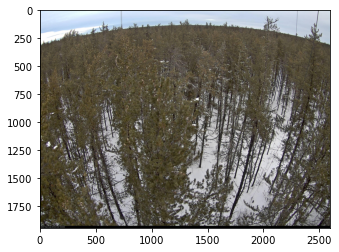

snow


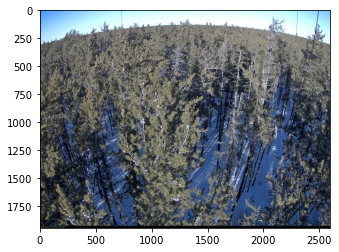

snow


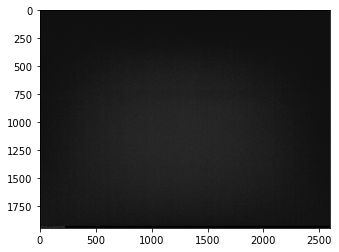

too dark


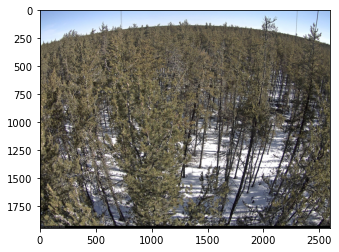

snow


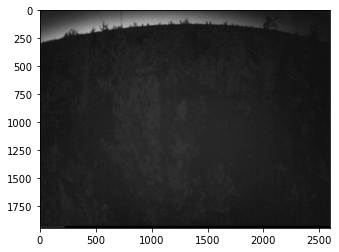

too dark


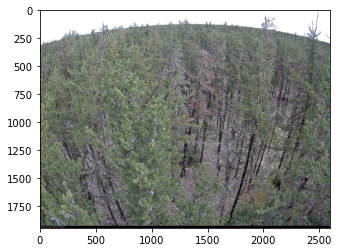

no snow


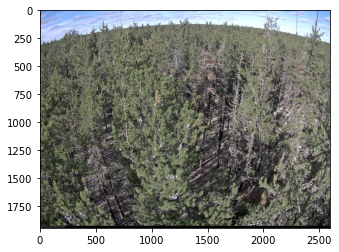

no snow


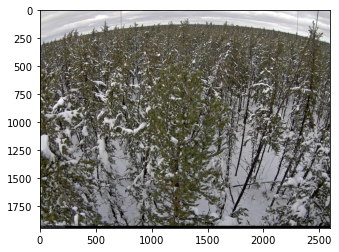

snow


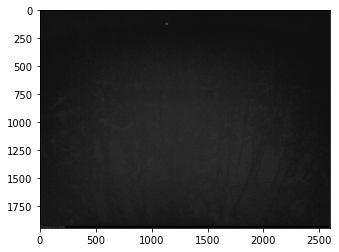

too dark


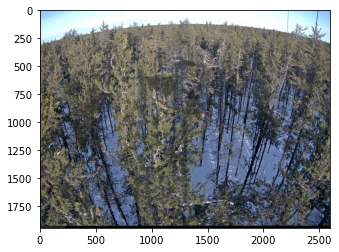

snow


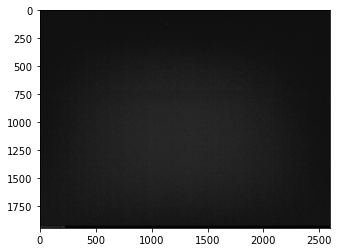

too dark


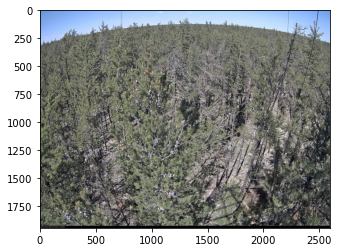

no snow


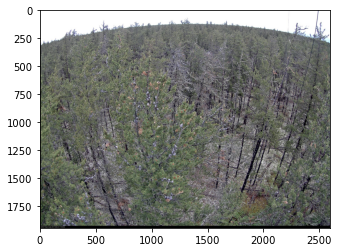

no snow


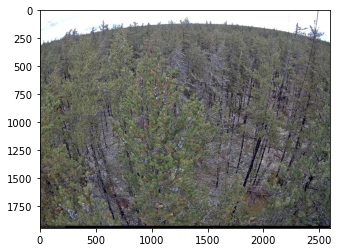

no snow


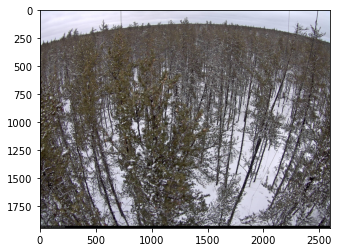

snow


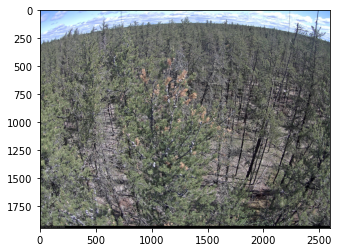

no snow


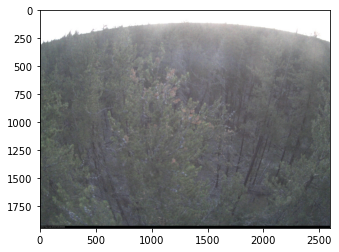

no snow


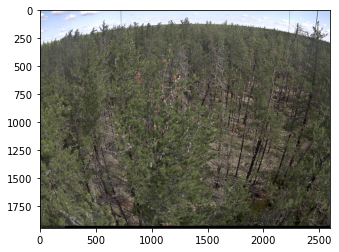

no snow


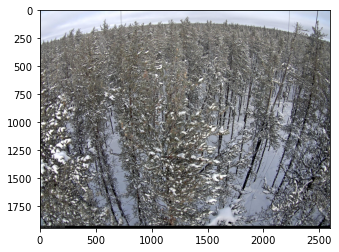

snow


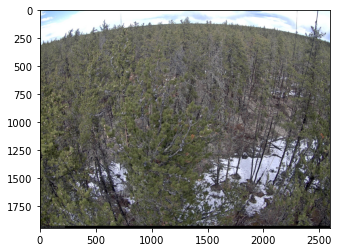

no snow


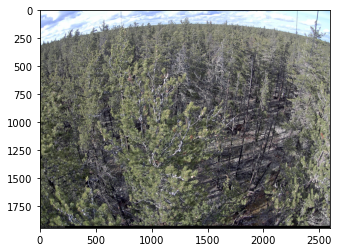

no snow


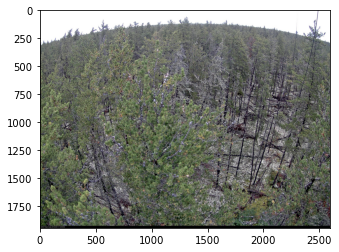

no snow


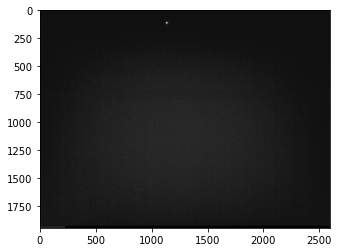

too dark


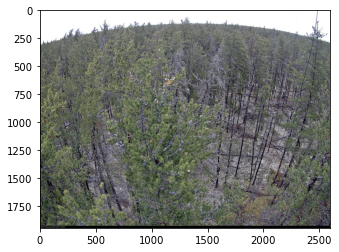

no snow


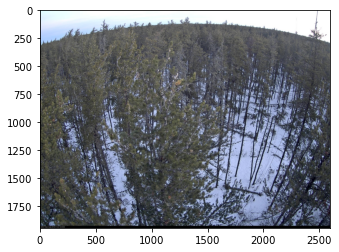

snow


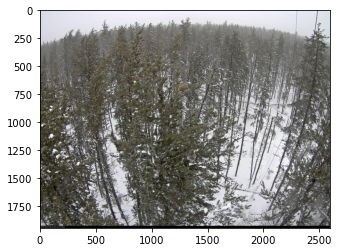

snow


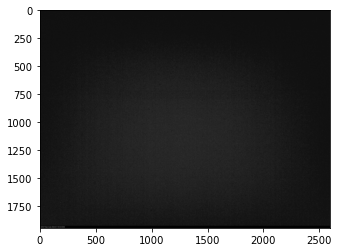

too dark


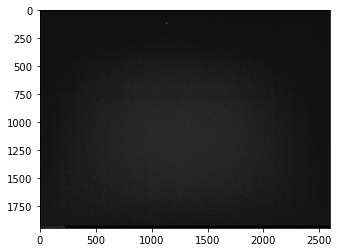

too dark


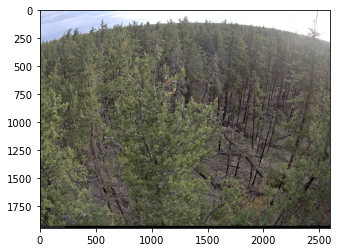

no snow


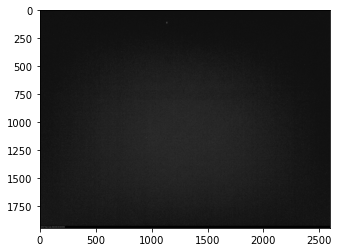

too dark


In [58]:
num_to_display = 30

for i in range(num_to_display):
    img = plt.imread(f'canadaojp_test/{predictions.iloc[i].img_name}')
    plt.imshow(img)
    plt.pause(0.0001)
    print(predictions.iloc[i].label)

Now let's try this on another site.

In [67]:
site_name = 'canadaOBS'
categories = ['too dark', 'no snow', 'snow']

download_args = {
    'site_name': site_name,
    'dates': get_site_dates(site_name),
    'save_to': site_name,
    'n_photos': 300
}
label_args = {
    'img_dir': site_name,
    'categories': categories,
    'save_to': site_name + '/annotations.csv',
    'site_name': site_name
}

dm2 = PhenocamDataModule(16, download_args, label_args)

In [121]:
# If the images are already downloaded and labeled, run this cell
images_dir = 'canadaOBS'
annotations_path = images_dir + '/annotations.csv'

download_args = {
    'done': True,
    'save_to': images_dir
}
label_args = {
    'done': True,
    'save_to': annotations_path
}

dm2 = PhenocamDataModule(16, download_args, label_args)

In [122]:
dm2.prepare_data()

In [123]:
model2 = ImagenetTransferLearning()
trainer2 = pl.Trainer(gpus=1, log_every_n_steps=8, gradient_clip_val=0.01, callbacks=[EarlyStopping(monitor="val_loss")])

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


In [124]:
trainer2.fit(model2, dm2)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type       | Params
-------------------------------------------------
0 | feature_extractor | Sequential | 11.2 M
1 | classifier        | Linear     | 1.5 K 
-------------------------------------------------
1.5 K     Trainable params
11.2 M    Non-trainable params
11.2 M    Total params
44.712    Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

C:\Users\jewik\anaconda3\envs\lightning\lib\site-packages\pytorch_lightning\trainer\data_loading.py:105: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\jewik\anaconda3\envs\lightning\lib\site-packages\pytorch_lightning\trainer\data_loading.py:105: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: -1it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

C:\Users\jewik\anaconda3\envs\lightning\lib\site-packages\pytorch_lightning\trainer\trainer.py:1047: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [125]:
trainer2.checkpoint_callback.best_model_path

'C:\\Users\\jewik\\GitRepos\\lightning\\lightning_logs\\version_22\\checkpoints\\epoch=16-step=237.ckpt'

In [126]:
# CHANGE ME!
ckpt_path2 = 'C:\\Users\\jewik\\GitRepos\\lightning\\lightning_logs\\version_22\\checkpoints\\epoch=16-step=237.ckpt'

best_model2 = model2.load_from_checkpoint(ckpt_path2)
best_model2.freeze()

In [127]:
my_site = 'canadaOBS'
img_urls = download(my_site, get_site_dates(my_site), n_photos=30, verbose=True, save_to='canadaOBS_test')

Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/2013/01/canadaOBS_2013_01_22_093128.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/2015/10/canadaOBS_2015_10_10_070125.jpg
Could not find an image within 5 minutes of 2019-05-22 03:30:00
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/2017/06/canadaOBS_2017_06_20_170135.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/2015/03/canadaOBS_2015_03_03_050123.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/2016/07/canadaOBS_2016_07_28_163153.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/2020/04/canadaOBS_2020_04_25_053112.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/2015/07/canadaOBS_2015_07_01_193133.jpg
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/2012/10/canadaOBS_2012_10_29_113132.jpg
Could not find an image within 5 minutes of 2016-11-12 02:30:00
Retrieved https://phenocam.sr.unh.edu/data/archive/canadaOBS/201

In [128]:
predictions = get_model_predictions('canadaOBS_test', 'jpg', ['no snow', 'snow', 'too dark'], best_model2)

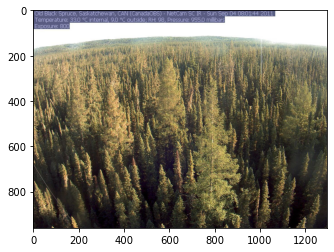

no snow


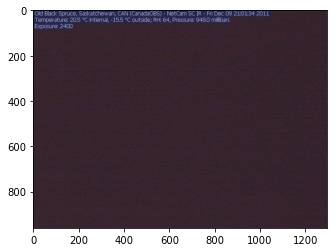

too dark


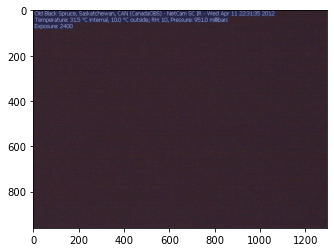

too dark


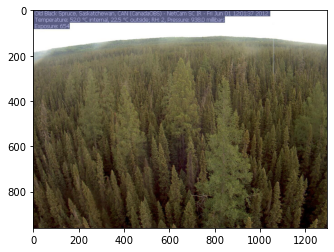

no snow


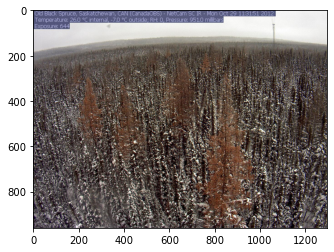

snow


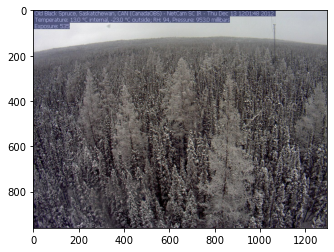

snow


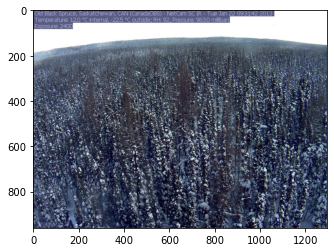

snow


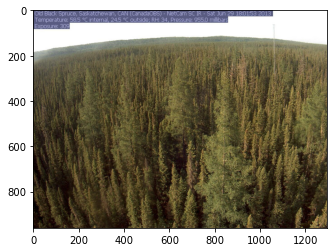

no snow


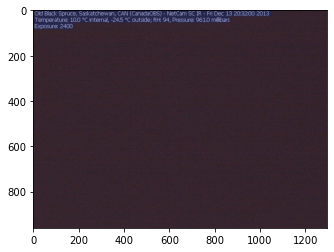

too dark


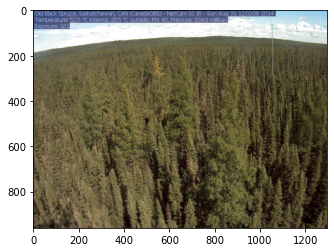

no snow


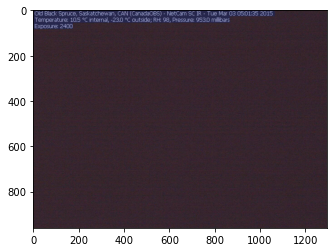

too dark


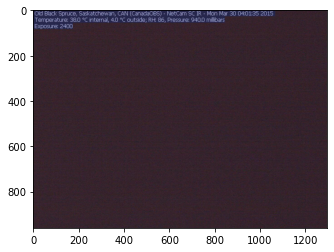

too dark


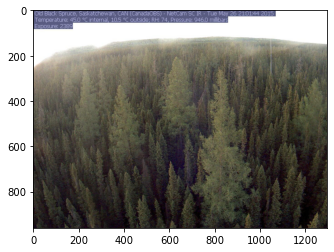

no snow


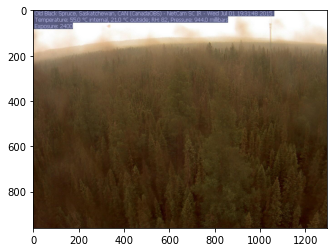

no snow


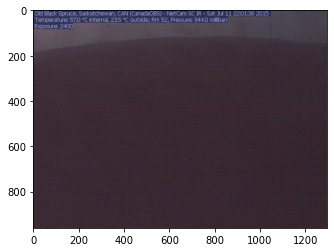

too dark


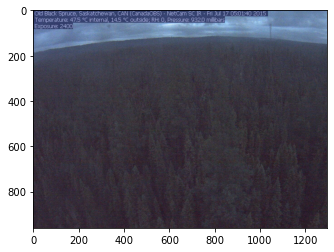

snow


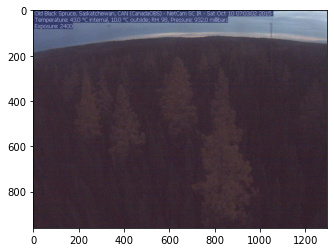

no snow


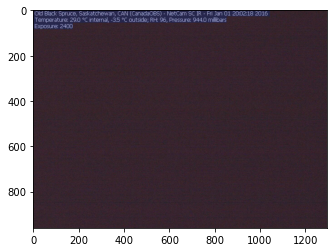

too dark


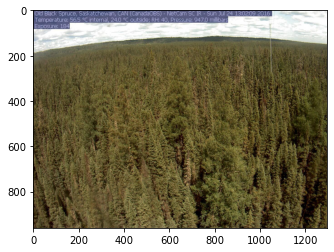

no snow


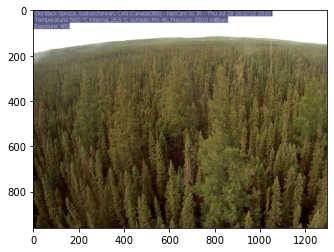

no snow


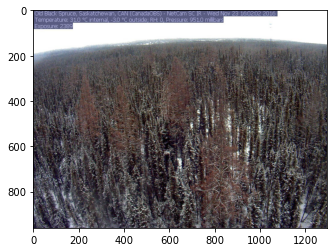

snow


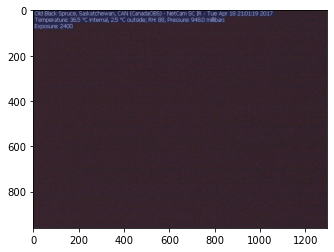

too dark


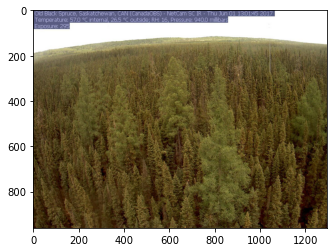

no snow


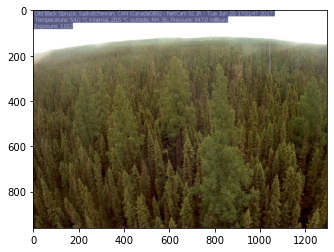

no snow


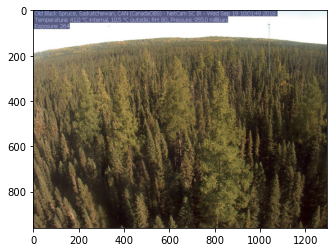

no snow


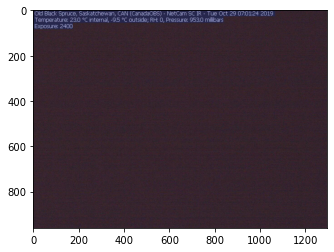

too dark


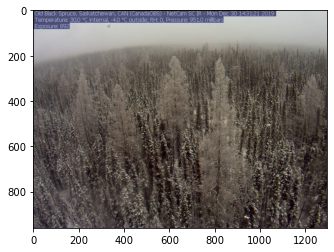

snow


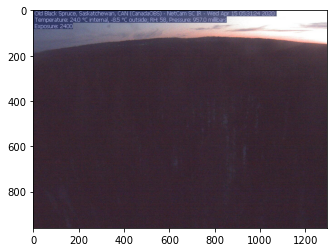

too dark


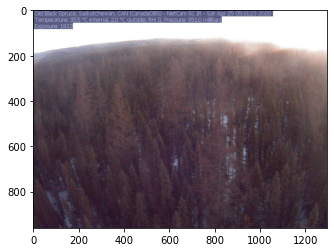

no snow


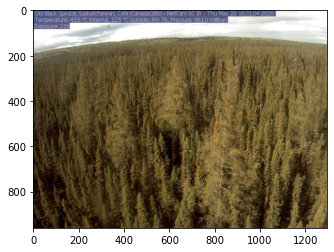

no snow


In [129]:
num_to_display = 30

for i in range(num_to_display):
    img = plt.imread(f'canadaOBS_test/{predictions.iloc[i].img_name}')
    plt.imshow(img)
    plt.pause(0.0001)
    print(predictions.iloc[i].label)